In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import networkx as nx
import plotly.graph_objects as go
import ast

# Base de Informações

In [2]:
df_info = pd.read_excel('boardgame_info.xlsx')

#esse df está check, nada a ser excluído de momento

df_info.head()

,object_id,name,yearpublished,sortindex,minplayers,maxplayers,minplaytime,maxplaytime,minage
0,174430,Gloomhaven,2017,1,1,4,60,120,12
1,161936,Pandemic Legacy Season 1,2015,2,2,4,60,60,13
2,167791,Terraforming Mars,2016,3,1,5,120,120,12
3,182028,Through the Ages A New Story of Civilization,2015,4,2,4,120,120,14
4,224517,Brass Birmingham,2018,5,2,4,60,120,14


É legal saber que está em ordem decrescente de avaliação do BGG

In [3]:
df_info[df_info['object_id'] == 13].head()
#dando uma olhada no jogo com mais reviews

,object_id,name,yearpublished,sortindex,minplayers,maxplayers,minplaytime,maxplaytime,minage
352,13,The Settlers of Catan,1995,353,3,4,60,120,10


In [4]:
df_info.describe()

,object_id,yearpublished,sortindex,minplayers,maxplayers,minplaytime,maxplaytime,minage
count,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000
mean,88671.356815,1981.279976,10001.834782,2.055256,5.591427,68.080735,94.271533,9.475120
std,90648.089927,219.137802,5774.059572,0.745471,15.043261,466.317247,1005.354972,3.739411
min,1.000000,-3500.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5857.500000,1997.000000,5000.750000,2.000000,4.000000,20.000000,30.000000,8.000000
50%,39284.500000,2008.000000,10003.500000,2.000000,4.000000,30.000000,45.000000,10.000000
75%,169680.500000,2015.000000,15001.250000,2.000000,6.000000,60.000000,90.000000,12.000000
max,295770.000000,2021.000000,20000.000000,10.000000,999.000000,60000.000000,120000.000000,25.000000


Como primeira interação com os dados, gosto de utilizar a informação da mediana de cada variável, ou até mesmo o terceiro quartil. Daqui tiramos algumas informações:
1-Metade dos jogos é de 2008 em diante;
2-Com dois jogadores, é possível jogar mais de três quartos dos jogos;
3-Em menos de 45' possível terminar mis de 50% dos jogos;
4-Maior parte dos jogos é relativamente simples (jogabilidade começa aos 12 anos de idade em 75% dos casos).

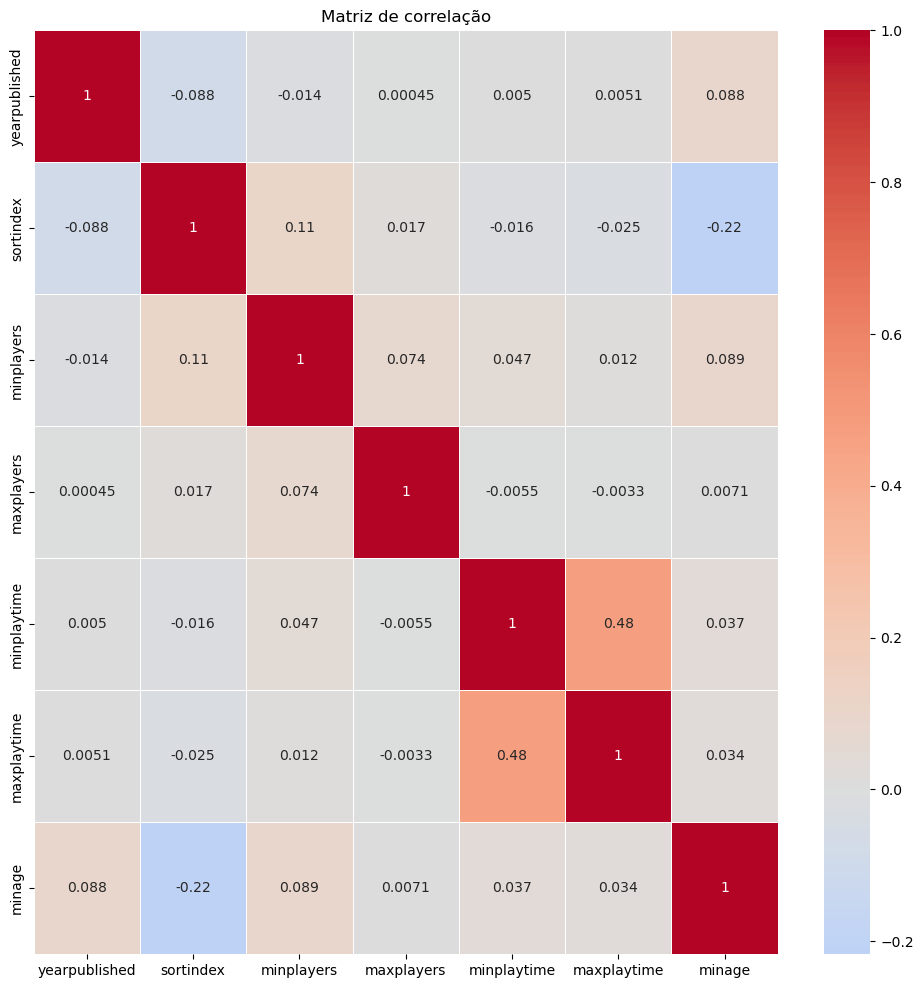

In [5]:
correlacao = df_info[['yearpublished','sortindex','minplayers','maxplayers','minplaytime','maxplaytime','minage']].corr()

plt.figure(figsize=(12, 12))
sns.heatmap(correlacao, annot=True, cmap="coolwarm", center=0, linewidths=0.5)
#criando matriz de correlação

plt.title('Matriz de correlação')

plt.show()

Usando uma matriz de correlação, vemos que as únicas variáveis numéricas com algum tipo de correlação são as de tempo mínimo e máximo de jogo, o que faz sentido, se um jogo tem tempo mínimo maior, seu tempo máximo tende a ser maior.

# Base de categorias

In [6]:
df_cat = pd.read_excel('boardgame_categoricals.xlsx')

df_cat.drop(labels=['label'], inplace=True, axis=1)
#todos os jogos são de tabuleiro, coluna inútil

df_cat.drop(labels=['gamelink'], inplace=True, axis=1)
#link que leva para o jogo, pode ser útil em caso de aprofundamento, mas não agora

df_cat.head()

,objectid,boardgamedesigner_cnt,boardgameartist_cnt,boardgamepublisher_cnt,boardgamehonor_cnt,boardgamecategory_cnt,boardgamemechanic_cnt,boardgameexpansion_cnt,boardgameversion_cnt,boardgamefamily_cnt,boardgamedesigner,boardgameartist,boardgamepublisher,boardgamehonor,boardgamecategory,boardgameversion,boardgamemechanic,boardgameexpansion,boardgamefamily
0,174430,1,3,9,23,5,12,4,19,7,"['Isaac Childres""']","['Alexandr Elichev', 'Josh T. McDowell', 'Alva...","['Cephalofair Games', 'Albi', 'Asmodee', 'Feue...",['2017 Best Science Fiction or Fantasy Board G...,"['Adventure', 'Exploration', 'Fantasy', 'Fight...","['Chinese edition', 'Czech edition', 'English ...","['Campaign / Battle Card Driven', 'Cooperative...","['Gloomhaven: Forgotten Circles', 'Gloomhaven:...","['Campaign Games', 'Components: Miniatures', '..."
1,161936,2,1,11,20,2,8,0,33,3,"['Rob Daviau""', 'Matt Leacock""']",['Chris Quilliams'],"['Z-Man Games', 'Asterion Press', 'Devir', 'Fi...",['2015 Cardboard Republic Immersionist Laurel ...,"['Environmental', 'Medical']","['Chinese blue edition', 'Chinese red edition'...","['Action Points', 'Cooperative Game', 'Hand Ma...",['None'],"['Campaign Games', 'Legacy', 'Pandemic']"
2,167791,1,1,20,20,6,9,15,29,6,"['Jacob Fryxelius""']",['Isaac Fryxelius'],"['FryxGames', 'Arclight', 'Fantasmagoria', 'Gh...",['2016 Cardboard Republic Architect Laurel Nom...,"['Economic', 'Environmental', 'Industry / Manu...","['Bulgarian edition', 'Chinese edition', 'Czec...","['Card Drafting', 'End Game Bonuses', 'Hand Ma...",['French Championship Promo Cards (fan expansi...,"['Fryxgames Future Timeline', 'Planets: Mars',..."
3,182028,1,4,13,3,3,5,1,14,2,"['Vlaada Chv\\u00e1til""']","['Filip Murmak', 'Radim Pech', 'Jakub Politzer...","['Czech Games Edition', 'Cranio Creations', 'D...",['2015 Golden Geek Best Strategy Board Game No...,"['Card Game', 'Civilization', 'Economic']","['Chinese edition', 'Czech edition', 'English ...","['Action Points', 'Auction/Bidding', 'Auction:...",['Through the Ages: New Leaders and Wonders'],"['Tableau Building', 'Through the Ages']"
4,224517,3,3,8,6,3,8,0,9,6,"['Gavan Brown""', 'Matt Tolman""', 'Martin Walla...","['Lina Cossette', 'David Forest', 'Damien Mamm...","['Roxley', 'BoardM Factory', 'Conclave Editora...",['2018 Golden Geek Best Board Game Artwork & P...,"['Economic', 'Industry / Manufacturing', 'Tran...","['English deluxe edition', 'English retail edi...","['Hand Management', 'Income', 'Loans', 'Market...",['None'],"['Beer', 'Brass', 'Cities: Birmingham (England..."


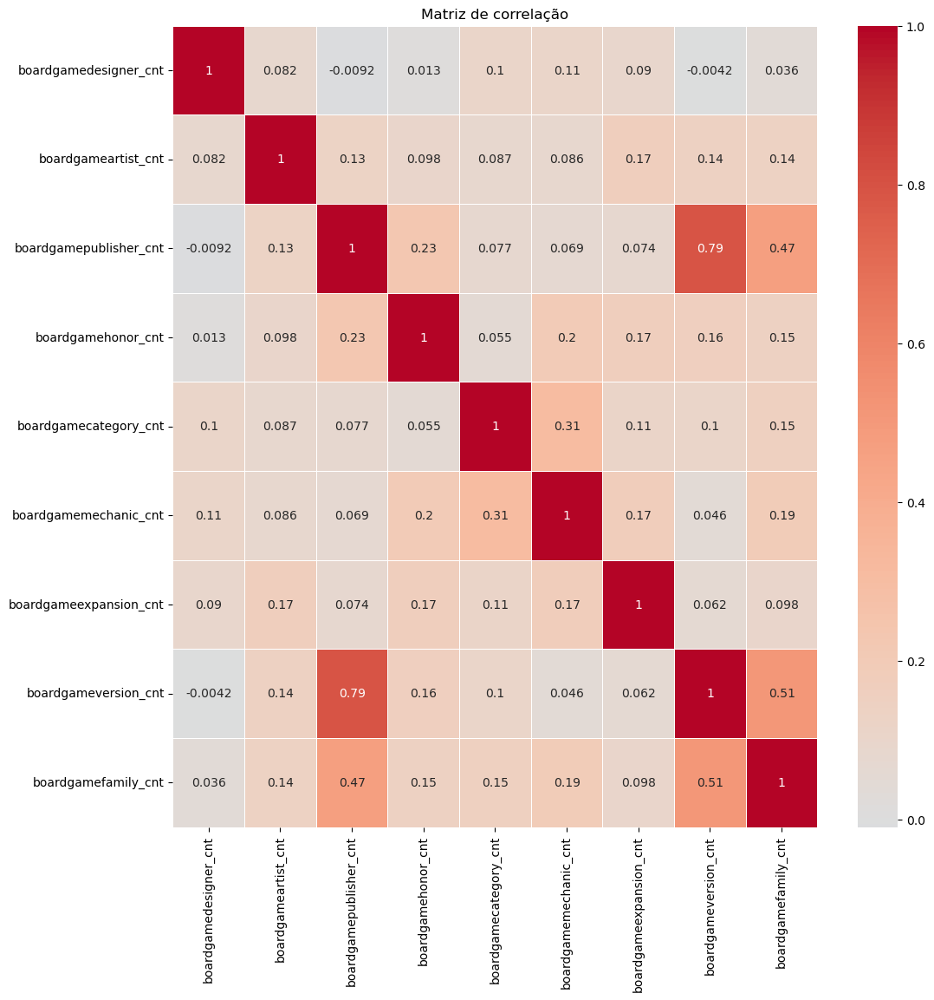

In [7]:
correlacao = df_cat[['boardgamedesigner_cnt','boardgameartist_cnt','boardgamepublisher_cnt','boardgamehonor_cnt','boardgamecategory_cnt','boardgamemechanic_cnt','boardgameexpansion_cnt','boardgameversion_cnt','boardgamefamily_cnt']].corr()

plt.figure(figsize=(12, 12))
sns.heatmap(correlacao, annot=True, cmap="coolwarm", center=0, linewidths=0.5)

plt.title('Matriz de correlação')

plt.show()

A principal correlação vista aqui é em relação à quantidade de publicadores dos jogos: quanto mais publicadores, mais versões o jogo tem, o que faz muito sentido do ponto de vista econômico. Há também uma leve correlação entre as duas variáveis citadas anteriormente, com a quantidade de famílias em que o jogo se enquadra, ou seja, quanto mais publicadores e mais edições o jogo tem, mais interdisciplinar ele tende a ser.

In [8]:
print(df_cat['boardgamedesigner'].str.count('Isaac Childres').sum())
print(df_cat['boardgamedesigner'].str.count('Jacob Fryxelius').sum())
print(df_cat['boardgamedesigner'].str.count('Rob Daviau').sum())
print(df_cat['boardgamedesigner'].str.count('Matt Leacock').sum())
print(df_cat['boardgamedesigner'].str.count('Vlaada Chv\\u00e1til').sum())
print(df_cat['boardgamedesigner'].str.count('Gavan Brown').sum())
print(df_cat['boardgamedesigner'].str.count('Matt Tolman').sum())

4
3
48
19
0
3
3


Avaliando a frequência dos desingners dos jogos mais bem avaliados, procurando por algum fora da curva. Analisaremos isso com os grafos mais adiante.

In [4]:
df = pd.read_excel('df_unificado.xlsx')

In [7]:
#criando as classes de idade
for index, row in df.iterrows():
    if row['minage'] <= 6:
        df.loc[index,'age_class'] =  'early_child'
    if row['minage'] >= 7:
        df.loc[index,'age_class'] =  'grown_child'
    if row['minage'] >= 12:
        df.loc[index,'age_class'] =  'teenager'
    if row['minage'] >= 18:
        df.loc[index,'age_class'] =  'adult' 

In [12]:
fig = px.scatter(df, x="yearpublished", y="totalvotes", color="age_class",
                 size="boardgamehonor_cnt")
fig.update_xaxes(range=[1970, 2020])
fig.show()

Nesse gráfico, vemos algumas características interessantes:
1-Antes dos anos 2000, os jogos não possuiam uma quantidade relevante de votos e/ou premiações;
2-Os jogos mais votados(em certa medida, mais populares), são em geral, os mais premiados (de certa forma, melhores). Então, percebemos uma correlação entre popularidade de qualidade;
3-Os jogos mais populares e mais premiados, são os cujas idades mínimas abarcam crianças mais velhas e adolescentes;
4-Jogos para adultos são raríssimos, visto que há apenas um visível, discretamente, no gráfico;
5-Jogos para crianças pequenas possuem poquíssimos votos, e em geral, poucas premiações. Acreditamos que isso esteja atrelado ao fato de esses jogos serem extremamente simples, dado que crianças menores de 6 anos, raramente sabem ler.

In [106]:
fig = px.scatter(df, x="yearpublished", y="usersrated", color="age_class",
                 size="boardgamehonor_cnt")
fig.update_xaxes(range=[1970, 2020])
fig.show()

 Mesmo alterando a métrica de popularidade, entre 'totalvotes' e 'usersrated', a aparência dos gráficos, e portanto as conclusões, permanecem iguais. Dessa forma, em um possível modelo preditivo de regressão, poderíamos reduzir as dimensões, utilizando uma média entre elas, ou até mesmo eliminando alguma. Outro ponto que cabe citar, é uma possível tendência de queda na quantidade de jogos de destaque,  visto que os maiores são de 2010.

In [10]:
fig = px.scatter_3d(df, x='yearpublished', y='usersrated', z='boardgamecategory_cnt',
              color='age_class', size="boardgamehonor_cnt")
fig.update_layout(scene=dict(xaxis=dict(range=[1990, 2020])))
fig.update_layout(scene=dict(zaxis=dict(range=[0, 8])))
fig.show()

Como complemento dos dois gráficos anteriores, mas gora em 3D, vemos que a faixa de quantidade de categorias ideal para um jogo é de 1 a 5.

In [5]:
for index, row in df.iterrows():
    if row['minplayers'] == 0:
        df.loc[index,'group_class'] =  'no_group'
    if row['minplayers'] >= 1:
        df.loc[index,'group_class'] =  'small_group'
    if row['minplayers'] >= 3:
        df.loc[index,'group_class'] =  'mid_group'
    if row['minplayers'] >= 7:
        df.loc[index,'group_class'] =  'big_group' 

In [140]:
fig = px.scatter(df, x="yearpublished", y="usersrated", color="group_class",
                 size="boardgamehonor_cnt")
fig.update_xaxes(range=[1970, 2020])
fig.show()

In [144]:
fig = px.scatter(df, x="languagedependence", y="usersrated", color="age_class",
                 size="boardgamehonor_cnt")
fig.show()

In [7]:
fig = px.violin(df, y="boardgamehonor_cnt", x="age_class")
fig.show()

In [5]:
fig = px.violin(df, y="boardgamehonor_cnt", x="age_class")
fig.show()

In [68]:
dff = pd.read_excel('df_final.xlsx')

In [48]:
pd.set_option('display.max_columns', 50)

In [114]:
dff = dff[dff['Cluster'] == 2] #criando uma restrição de popularidade para simular o cluster
dff.head()

,Unnamed: 0,usersrated,numgeeklists,numwanting,numcomments,siteviews,news,blogs,weblink,podcast,average_tratado,baverage_tratado,Cluster,visibilidade externa,name,objectid,boardgamecategory,boardgamemechanic,boardgamefamily,category
0,0,31254,3657,1365,5972,8933078,7,471,31,139,8.85292,8.58424,2,648,Gloomhaven,174430,"['Adventure', 'Exploration', 'Fantasy', 'Fight...","['Campaign / Battle Card Driven', 'Cooperative...","['Campaign Games', 'Components: Miniatures', '...","[Adventure, Exploration, Fantasy, Fighting, Mi..."
1,1,34729,3612,771,5477,2971746,9,597,69,164,8.62499,8.47159,2,839,Pandemic Legacy Season 1,161936,"['Environmental', 'Medical']","['Action Points', 'Cooperative Game', 'Hand Ma...","['Campaign Games', 'Legacy', 'Pandemic']","[Environmental, Medical]"
2,2,48339,5941,2068,7274,4724387,14,1158,60,148,8.42299,8.26781,2,1380,Terraforming Mars,167791,"['Economic', 'Environmental', 'Industry / Manu...","['Card Drafting', 'End Game Bonuses', 'Hand Ma...","['Fryxgames Future Timeline', 'Planets: Mars',...","[Economic, Environmental, Industry / Manufactu..."
6,6,36644,9658,1341,8095,4506683,2,323,84,82,8.31307,8.16138,2,491,Twilight Struggle,12333,"['Modern Warfare', 'Political', 'Wargame']","['Action/Event', 'Advantage Token', 'Area Majo...","['Cold War', 'Country: Soviet Union', 'Country...","[Modern Warfare, Political, Wargame]"
7,7,18991,1956,1367,3037,2949888,1,204,35,65,8.42602,8.15575,2,305,Star Wars Rebellion,187645,"['Fighting', 'Miniatures', 'Movies / TV / Radi...","['Area Majority / Influence', 'Area Movement',...","['Components: Miniatures', 'Star Wars']","[Fighting, Miniatures, Movies / TV / Radio the..."


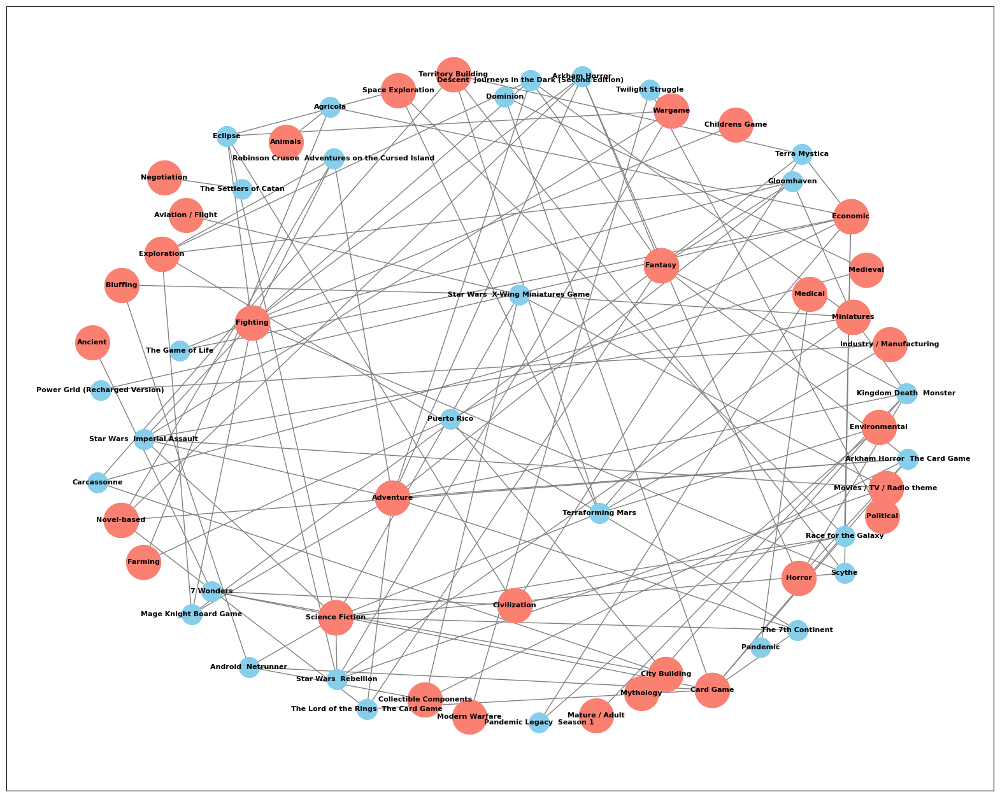

In [111]:
dff = pd.read_excel('df_final.xlsx')
dff = dff[dff['Cluster'] == 2]
dff['category'] = dff['boardgamecategory'].apply(ast.literal_eval)
dff_explodido = dff.explode('category').reset_index(drop=True)
G = nx.Graph()
G.add_nodes_from(dff_explodido['name'].unique(), bipartite=0)
G.add_nodes_from(dff_explodido['category'].unique(), bipartite=1)

for _, row in dff_explodido.iterrows():
    G.add_edge(row['name'], row['category'])

cores = {'name': 'skyblue', 'category': 'salmon'}

pos = nx.spring_layout(G, k=2)
fig, ax = plt.subplots(figsize=(20, 16))
# Desenho do grafo
nx.draw_networkx_nodes(G, pos, nodelist=dff_explodido['name'], node_color=cores['name'], node_size=500)
nx.draw_networkx_nodes(G, pos, nodelist=dff_explodido['category'], node_color=cores['category'], node_size=1500)
nx.draw_networkx_edges(G, pos, edgelist=G.edges(), edge_color='gray', arrowsize=3)
nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold')

plt.show()

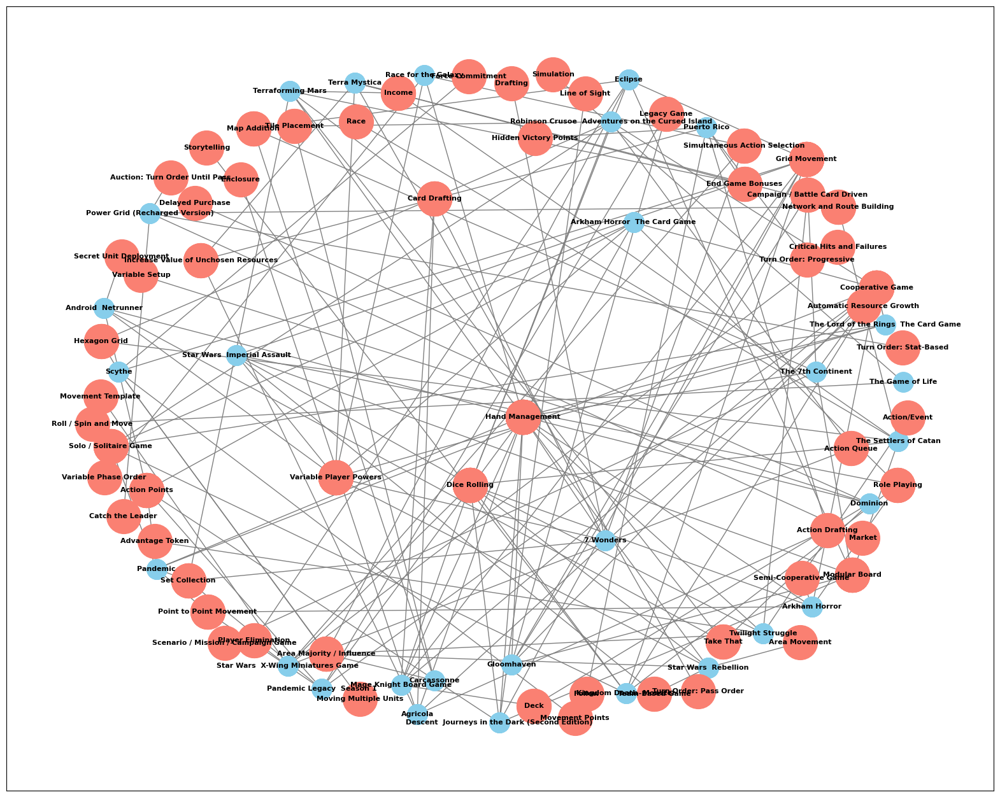

In [115]:
dff = pd.read_excel('df_final.xlsx')
dff = dff[dff['Cluster'] == 2]
dff['category'] = dff['boardgamemechanic'].apply(ast.literal_eval)
dff_explodido = dff.explode('category').reset_index(drop=True)
G = nx.Graph()
G.add_nodes_from(dff_explodido['name'].unique(), bipartite=0)
G.add_nodes_from(dff_explodido['category'].unique(), bipartite=1)

for _, row in dff_explodido.iterrows():
    G.add_edge(row['name'], row['category'])

cores = {'name': 'skyblue', 'category': 'salmon'}

pos = nx.spring_layout(G, k=2)
fig, ax = plt.subplots(figsize=(20, 16))
# Desenho do grafo
nx.draw_networkx_nodes(G, pos, nodelist=dff_explodido['name'], node_color=cores['name'], node_size=500)
nx.draw_networkx_nodes(G, pos, nodelist=dff_explodido['category'], node_color=cores['category'], node_size=1500)
nx.draw_networkx_edges(G, pos, edgelist=G.edges(), edge_color='gray', arrowsize=3)
nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold')

plt.show()

In [2]:
import pandas as pd
import networkx as nx
import plotly.graph_objects as go
import ast

# Carregar os dados
dff = pd.read_excel('df_final.xlsx')
dff = dff[dff['Cluster'] == 2]
dff['category'] = dff['boardgamemechanic'].apply(ast.literal_eval)
dff_exploded = dff.explode('category').reset_index(drop=True)

# Criar o grafo
G = nx.Graph()
G.add_nodes_from(dff_exploded['name'].unique(), bipartite=0)
G.add_nodes_from(dff_exploded['category'].unique(), bipartite=1)

for _, row in dff_exploded.iterrows():
    G.add_edge(row['name'], row['category'])

# Cores dos nós
cores = {'name': 'skyblue', 'category': 'salmon'}

# Layout do grafo
pos = nx.spring_layout(G, k=2)

# Nós e arestas
node_trace = go.Scatter(
    x=[pos[node][0] for node in G.nodes()],
    y=[pos[node][1] for node in G.nodes()],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        size=[500 if node in dff_exploded['name'].unique() else 1500 for node in G.nodes()],
        color=[cores['name'] if node in dff_exploded['name'].unique() else cores['category'] for node in G.nodes()]
    ),
    text=[node for node in G.nodes()]
)

edge_trace = go.Scatter(
    x=[],
    y=[],
    line=dict(width=0.5, color='gray'),
    hoverinfo='none',
    mode='lines'
)

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace['x'] += [x0, x1, None]
    edge_trace['y'] += [y0, y1, None]

# Plot
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Grafo de Inter-relacionamentos',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

TypeError: can only concatenate tuple (not "list") to tuple

In [3]:
import pandas as pd
import networkx as nx
import plotly.graph_objects as go
import ast

# Carregar os dados
dff = pd.read_excel('df_final.xlsx')
dff = dff[dff['Cluster'] == 2]
dff['category'] = dff['boardgamemechanic'].apply(ast.literal_eval)
dff_exploded = dff.explode('category').reset_index(drop=True)

# Criar o grafo
G = nx.Graph()
G.add_nodes_from(dff_exploded['name'].unique(), bipartite=0)
G.add_nodes_from(dff_exploded['category'].unique(), bipartite=1)

for _, row in dff_exploded.iterrows():
    G.add_edge(row['name'], row['category'])

# Cores dos nós
cores = {'name': 'skyblue', 'category': 'salmon'}

# Layout do grafo
pos = nx.spring_layout(G, k=2)

# Nós e arestas
node_trace = go.Scatter(
    x=tuple(pos[node][0] for node in G.nodes()),
    y=tuple(pos[node][1] for node in G.nodes()),
    mode='markers',
    hoverinfo='text',
    marker=dict(
        size=[500 if node in dff_exploded['name'].unique() else 1500 for node in G.nodes()],
        color=[cores['name'] if node in dff_exploded['name'].unique() else cores['category'] for node in G.nodes()]
    ),
    text=[node for node in G.nodes()]
)

edge_trace = go.Scatter(
    x=[],
    y=[],
    line=dict(width=0.5, color='gray'),
    hoverinfo='none',
    mode='lines'
)

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace['x'] += [x0, x1, None]
    edge_trace['y'] += [y0, y1, None]

# Plot
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Grafo de Inter-relacionamentos',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

TypeError: can only concatenate tuple (not "list") to tuple

In [4]:
import pandas as pd
import networkx as nx
import plotly.graph_objects as go
import ast

# Carregar os dados
dff = pd.read_excel('df_final.xlsx')
dff = dff[dff['Cluster'] == 2]
dff['category'] = dff['boardgamemechanic'].apply(ast.literal_eval)
dff_exploded = dff.explode('category').reset_index(drop=True)

# Criar o grafo
G = nx.Graph()
G.add_nodes_from(dff_exploded['name'].unique(), bipartite=0)
G.add_nodes_from(dff_exploded['category'].unique(), bipartite=1)

for _, row in dff_exploded.iterrows():
    G.add_edge(row['name'], row['category'])

# Cores dos nós
cores = {'name': 'skyblue', 'category': 'salmon'}

# Layout do grafo
pos = nx.spring_layout(G, k=2)

# Nós e arestas
node_trace = go.Scatter(
    x=tuple(pos[node][0] for node in G.nodes()),
    y=tuple(pos[node][1] for node in G.nodes()),
    mode='markers',
    hoverinfo='text',
    marker=dict(
        size=[500 if node in dff_exploded['name'].unique() else 1500 for node in G.nodes()],
        color=[cores['name'] if node in dff_exploded['name'].unique() else cores['category'] for node in G.nodes()]
    ),
    text=[node for node in G.nodes()]
)

edge_trace = go.Scatter(
    x=[],
    y=[],
    line=dict(width=0.5, color='gray'),
    hoverinfo='none',
    mode='lines'
)

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace['x'] += [x0, x1, None]
    edge_trace['y'] += [y0, y1, None]

# Plot
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Grafo de Inter-relacionamentos',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

TypeError: can only concatenate tuple (not "list") to tuple

In [5]:
import pandas as pd
import networkx as nx
import plotly.graph_objects as go
import ast

# Carregar os dados
dff = pd.read_excel('df_final.xlsx')
dff = dff[dff['Cluster'] == 2]
dff['category'] = dff['boardgamemechanic'].apply(ast.literal_eval)
dff_exploded = dff.explode('category').reset_index(drop=True)

# Criar o grafo
G = nx.Graph()
G.add_nodes_from(dff_exploded['name'].unique(), bipartite=0)
G.add_nodes_from(dff_exploded['category'].unique(), bipartite=1)

for _, row in dff_exploded.iterrows():
    G.add_edge(row['name'], row['category'])

# Cores dos nós
cores = {'name': 'skyblue', 'category': 'salmon'}

# Layout do grafo
pos = nx.spring_layout(G, k=2)

# Nós e arestas
node_trace = go.Scatter(
    x=tuple(pos[node][0] for node in G.nodes()),
    y=tuple(pos[node][1] for node in G.nodes()),
    mode='markers',
    hoverinfo='text',
    marker=dict(
        size=[500 if node in dff_exploded['name'].unique() else 1500 for node in G.nodes()],
        color=[cores['name'] if node in dff_exploded['name'].unique() else cores['category'] for node in G.nodes()]
    ),
    text=[node for node in G.nodes()]
)

edge_trace = go.Scatter(
    x=[],  # Inicializamos como uma lista vazia
    y=[],  # Inicializamos como uma lista vazia
    line=dict(width=0.5, color='gray'),
    hoverinfo='none',
    mode='lines'
)

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace['x'] += [x0, x1, None]
    edge_trace['y'] += [y0, y1, None]

# Plot
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Grafo de Inter-relacionamentos',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

TypeError: can only concatenate tuple (not "list") to tuple

In [6]:
import pandas as pd
import networkx as nx
import plotly.graph_objects as go
import ast

# Carregar os dados
dff = pd.read_excel('df_final.xlsx')
dff = dff[dff['Cluster'] == 2]
dff['category'] = dff['boardgamemechanic'].apply(ast.literal_eval)
dff_exploded = dff.explode('category').reset_index(drop=True)

# Criar o grafo
G = nx.Graph()
G.add_nodes_from(dff_exploded['name'].unique(), bipartite=0)
G.add_nodes_from(dff_exploded['category'].unique(), bipartite=1)

for _, row in dff_exploded.iterrows():
    G.add_edge(row['name'], row['category'])

# Cores dos nós
cores = {'name': 'skyblue', 'category': 'salmon'}

# Layout do grafo
pos = nx.spring_layout(G, k=2)

# Nós e arestas
node_trace = go.Scatter(
    x=[pos[node][0] for node in G.nodes()],
    y=[pos[node][1] for node in G.nodes()],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        size=[500 if node in dff_exploded['name'].unique() else 1500 for node in G.nodes()],
        color=[cores['name'] if node in dff_exploded['name'].unique() else cores['category'] for node in G.nodes()]
    ),
    text=[node for node in G.nodes()]
)

edge_trace = go.Scatter(
    x=[],  # Inicializamos como uma lista vazia
    y=[],  # Inicializamos como uma lista vazia
    line=dict(width=0.5, color='gray'),
    hoverinfo='none',
    mode='lines'
)

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace['x'] += [x0, x1, None]
    edge_trace['y'] += [y0, y1, None]

# Plot
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Grafo de Inter-relacionamentos',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

TypeError: can only concatenate tuple (not "list") to tuple

In [7]:
import pandas as pd
import networkx as nx
import plotly.graph_objects as go
import ast

# Carregar os dados
dff = pd.read_excel('df_final.xlsx')
dff = dff[dff['Cluster'] == 2]
dff['category'] = dff['boardgamemechanic'].apply(ast.literal_eval)
dff_exploded = dff.explode('category').reset_index(drop=True)

# Criar o grafo
G = nx.Graph()
G.add_nodes_from(dff_exploded['name'].unique(), bipartite=0)
G.add_nodes_from(dff_exploded['category'].unique(), bipartite=1)

for _, row in dff_exploded.iterrows():
    G.add_edge(row['name'], row['category'])

# Cores dos nós
cores = {'name': 'skyblue', 'category': 'salmon'}

# Layout do grafo
pos = nx.spring_layout(G, k=2)

# Nós e arestas
node_trace = go.Scatter(
    x=[],
    y=[],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        size=[500 if node in dff_exploded['name'].unique() else 1500 for node in G.nodes()],
        color=[cores['name'] if node in dff_exploded['name'].unique() else cores['category'] for node in G.nodes()]
    ),
    text=[node for node in G.nodes()]
)

for node in G.nodes():
    x, y = pos[node]
    node_trace['x'] += [x]
    node_trace['y'] += [y]

edge_trace = go.Scatter(
    x=[],  
    y=[],  
    line=dict(width=0.5, color='gray'),
    hoverinfo='none',
    mode='lines'
)

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace['x'] += [x0, x1, None]
    edge_trace['y'] += [y0, y1, None]

# Plot
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Grafo de Inter-relacionamentos',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

TypeError: can only concatenate tuple (not "list") to tuple

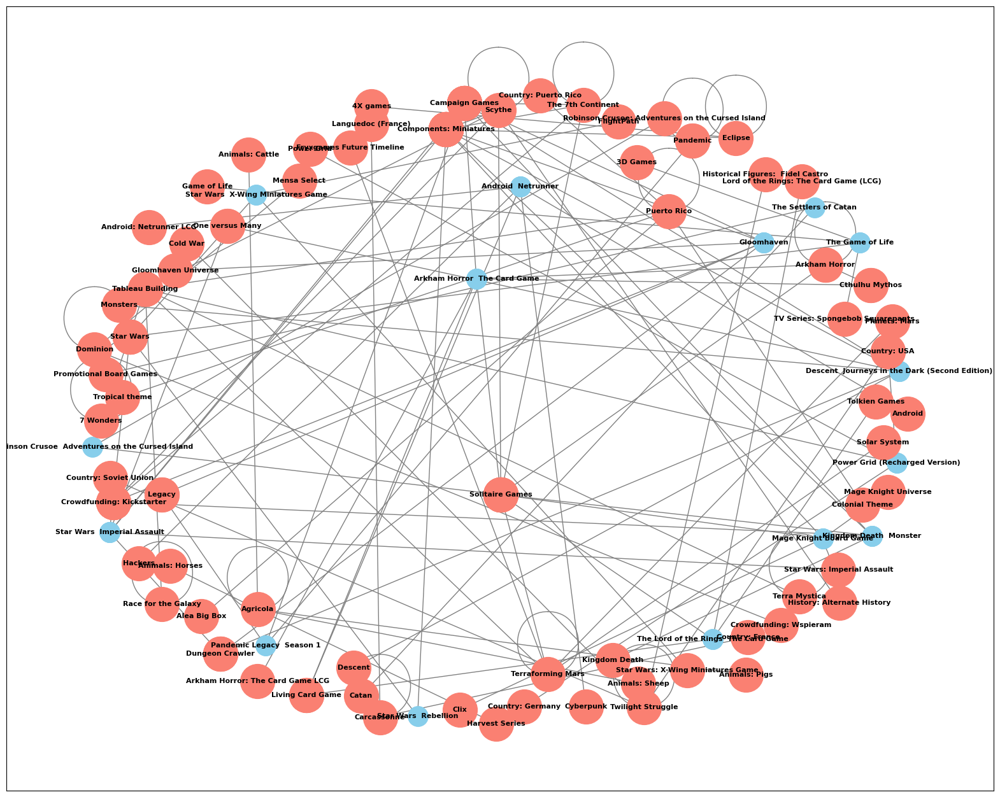

In [116]:
dff = pd.read_excel('df_final.xlsx')
dff = dff[dff['Cluster'] == 2]
dff['category'] = dff['boardgamefamily'].apply(ast.literal_eval)
dff_explodido = dff.explode('category').reset_index(drop=True)
G = nx.Graph()
G.add_nodes_from(dff_explodido['name'].unique(), bipartite=0)
G.add_nodes_from(dff_explodido['category'].unique(), bipartite=1)

for _, row in dff_explodido.iterrows():
    G.add_edge(row['name'], row['category'])

cores = {'name': 'skyblue', 'category': 'salmon'}

pos = nx.spring_layout(G, k=2)
fig, ax = plt.subplots(figsize=(20, 16))
# Desenho do grafo
nx.draw_networkx_nodes(G, pos, nodelist=dff_explodido['name'], node_color=cores['name'], node_size=500)
nx.draw_networkx_nodes(G, pos, nodelist=dff_explodido['category'], node_color=cores['category'], node_size=1500)
nx.draw_networkx_edges(G, pos, edgelist=G.edges(), edge_color='gray', arrowsize=3)
nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold')

plt.show()

In [54]:
dff.shape

(22, 36)

In [52]:
category_count = {}
for i in dff['category']:
    for j in i:
        category_count[j] = category_count.get(j, 0) + 1
category_count = pd.DataFrame.from_dict(category_count, orient='index', columns=['contagem'])
category_count.sort_values(by=['contagem'], ascending=False, inplace=True)
category_count.reset_index(names='categoria', inplace=True)
fig_categoria = px.bar(category_count.head(10), x='categoria', y='contagem')
fig_categoria.show()

In [ ]:
dff['category'] = dff['boardgamecategory'].apply(ast.literal_eval)
dff_explodido = dff.explode('category').reset_index(drop=True)
category_count = {}
for i in dff['category']:
    for j in i:
        category_count[j] = category_count.get(j, 0) + 1
category_count = pd.DataFrame.from_dict(category_count, orient='index', columns=['contagem'])
category_count.sort_values(by=['contagem'], ascending=False, inplace=True)
category_count.reset_index(names='categoria', inplace=True)
fig_categoria = px.bar(category_count.head(10), x='categoria', y='contagem')
fig_categoria.show()

In [9]:
df_cluster = pd.read_excel('df_cluster_2.xlsx')

In [11]:
df_cluster.head()

,Unnamed: 0,usersrated,numgeeklists,numwanting,numcomments,siteviews,news,blogs,weblink,podcast,average_tratado,baverage_tratado,Cluster,name,objectid
0,0,31254,3657,1365,5972,8933078,7,471,31,139,8.85292,8.58424,2,Gloomhaven,174430
1,1,34729,3612,771,5477,2971746,9,597,69,164,8.62499,8.47159,2,Pandemic Legacy Season 1,161936
2,2,48339,5941,2068,7274,4724387,14,1158,60,148,8.42299,8.26781,2,Terraforming Mars,167791
3,3,18269,2083,1049,2660,2448074,5,185,30,42,8.49419,8.23513,2,Through the Ages A New Story of Civilization,182028
4,6,36644,9658,1341,8095,4506683,2,323,84,82,8.31307,8.16138,2,Twilight Struggle,12333
